## Deep Learning Project

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# trouvons notre fichier dans le drive
!find /content/drive/MyDrive -iname "*realwaste*"

/content/drive/MyDrive/realwaste.zip


In [5]:
import os
zip_path = '/content/drive/MyDrive/realwaste.zip'
extract_path = '/content/realwaste'

# le dossier d'extraction
!mkdir -p {extract_path}

# le fichier zip decompressé
!unzip -q "{zip_path}" -d "{extract_path}"

In [6]:
print(f"Fichier décompressé dans {extract_path}")

Fichier décompressé dans /content/realwaste


### Exploration de la structure de nos données


In [7]:
# Explorons toute la structure des dossiers
!find /content/realwaste -type d
!find /content/realwaste -type f | head -10

/content/realwaste
/content/realwaste/realwaste-main
/content/realwaste/realwaste-main/RealWaste
/content/realwaste/realwaste-main/RealWaste/Vegetation
/content/realwaste/realwaste-main/RealWaste/Glass
/content/realwaste/realwaste-main/RealWaste/Cardboard
/content/realwaste/realwaste-main/RealWaste/Miscellaneous Trash
/content/realwaste/realwaste-main/RealWaste/Plastic
/content/realwaste/realwaste-main/RealWaste/Textile Trash
/content/realwaste/realwaste-main/RealWaste/Food Organics
/content/realwaste/realwaste-main/RealWaste/Paper
/content/realwaste/realwaste-main/RealWaste/Metal
/content/realwaste/realwaste-main/RealWaste/Vegetation/Vegetation_11.jpg
/content/realwaste/realwaste-main/RealWaste/Vegetation/Vegetation_367.jpg
/content/realwaste/realwaste-main/RealWaste/Vegetation/Vegetation_66.jpg
/content/realwaste/realwaste-main/RealWaste/Vegetation/Vegetation_363.jpg
/content/realwaste/realwaste-main/RealWaste/Vegetation/Vegetation_328.jpg
/content/realwaste/realwaste-main/RealWaste/

In [8]:
# le chemin correct vers les catégories
data_dir = '/content/realwaste/realwaste-main/RealWaste'

# Vérifions les catégories
categories = [f for f in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, f))]
print(f"Catégories trouvées ({len(categories)}): {categories}")

# Comptons les images par catégorie
total_files = 0
print("\nDistribution des images:")
for category in categories:
    category_path = os.path.join(data_dir, category)
    num_files = len([f for f in os.listdir(category_path) if os.path.isfile(os.path.join(category_path, f))])
    total_files += num_files
    print(f"  • {category}: {num_files} images")

print(f"\nTotal: {total_files} images")

Catégories trouvées (9): ['Vegetation', 'Glass', 'Cardboard', 'Miscellaneous Trash', 'Plastic', 'Textile Trash', 'Food Organics', 'Paper', 'Metal']

Distribution des images:
  • Vegetation: 436 images
  • Glass: 420 images
  • Cardboard: 461 images
  • Miscellaneous Trash: 495 images
  • Plastic: 921 images
  • Textile Trash: 318 images
  • Food Organics: 411 images
  • Paper: 500 images
  • Metal: 790 images

Total: 4752 images


### Préparation des données

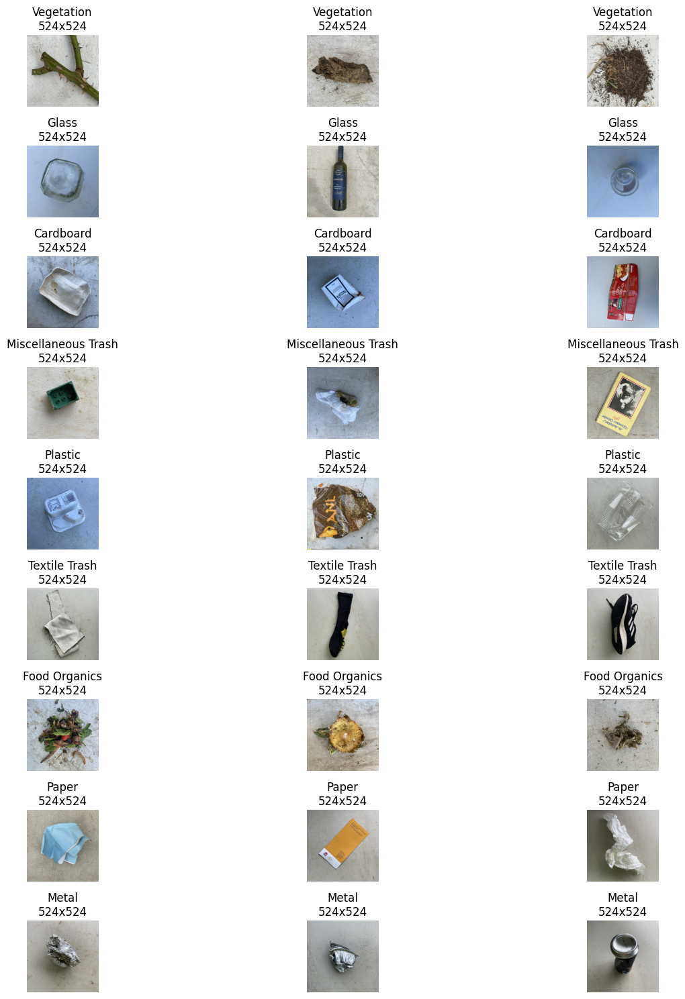

Données divisées en ensembles d'entraînement, validation et test.


In [9]:
# Visualisons des exemples d'images de chaque catégorie
import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image

plt.figure(figsize=(15, 15))
for i, category in enumerate(categories):
    category_path = os.path.join(data_dir, category)
    files = [f for f in os.listdir(category_path) if os.path.isfile(os.path.join(category_path, f))]

    # Prendre 3 images aléatoires de chaque catégorie
    sample_files = random.sample(files, min(3, len(files)))

    for j, file in enumerate(sample_files):
        img_path = os.path.join(category_path, file)
        img = Image.open(img_path)

        # Calculons la position dans la grille
        idx = i * 3 + j + 1
        plt.subplot(len(categories), 3, idx)
        plt.imshow(img)
        plt.title(f"{category}\n{img.size[0]}x{img.size[1]}")
        plt.axis('off')

plt.tight_layout()
plt.show()

# Maintenant, créons le pipeline de données et préparons le modèle
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Définissons les paramètres
img_height = 224
img_width = 224
batch_size = 32

# Divisons les données en train (70%), validation (15%), test (15%)
# Pour ce faire, nous devons créer des répertoires séparés

# Créons les répertoires pour train, validation et test
train_dir = '/content/train'
val_dir = '/content/validation'
test_dir = '/content/test'

# Supprimons les répertoires s'ils existent déjà
!rm -rf {train_dir} {val_dir} {test_dir}

# Créons les répertoires
for directory in [train_dir, val_dir, test_dir]:
    for category in categories:
        os.makedirs(os.path.join(directory, category), exist_ok=True)

# Fonction pour diviser les fichiers et les copier dans les répertoires appropriés
import shutil

for category in categories:
    files = [f for f in os.listdir(os.path.join(data_dir, category))
             if os.path.isfile(os.path.join(data_dir, category, f))]

    # Mélangeons les fichiers
    random.shuffle(files)

    # Calculons les indices de division
    n_files = len(files)
    n_train = int(0.7 * n_files)
    n_val = int(0.15 * n_files)

    # Divisons les fichiers
    train_files = files[:n_train]
    val_files = files[n_train:n_train+n_val]
    test_files = files[n_train+n_val:]

    # Copions les fichiers dans les répertoires appropriés
    for file in train_files:
        shutil.copy(
            os.path.join(data_dir, category, file),
            os.path.join(train_dir, category, file)
        )

    for file in val_files:
        shutil.copy(
            os.path.join(data_dir, category, file),
            os.path.join(val_dir, category, file)
        )

    for file in test_files:
        shutil.copy(
            os.path.join(data_dir, category, file),
            os.path.join(test_dir, category, file)
        )

print("Données divisées en ensembles d'entraînement, validation et test.")

Répartition des données:
Entraînement: 3323 images
  • Vegetation: 305 images
  • Glass: 294 images
  • Cardboard: 322 images
  • Miscellaneous Trash: 346 images
  • Plastic: 644 images
  • Textile Trash: 222 images
  • Food Organics: 287 images
  • Paper: 350 images
  • Metal: 553 images

Validation: 710 images
  • Vegetation: 65 images
  • Glass: 63 images
  • Cardboard: 69 images
  • Miscellaneous Trash: 74 images
  • Plastic: 138 images
  • Textile Trash: 47 images
  • Food Organics: 61 images
  • Paper: 75 images
  • Metal: 118 images

Test: 719 images
  • Vegetation: 66 images
  • Glass: 63 images
  • Cardboard: 70 images
  • Miscellaneous Trash: 75 images
  • Plastic: 139 images
  • Textile Trash: 49 images
  • Food Organics: 63 images
  • Paper: 75 images
  • Metal: 119 images
Found 3323 images belonging to 9 classes.
Found 710 images belonging to 9 classes.
Found 719 images belonging to 9 classes.

Dimensions des données:
Entraînement: 3323 échantillons, 9 classes
Validation: 

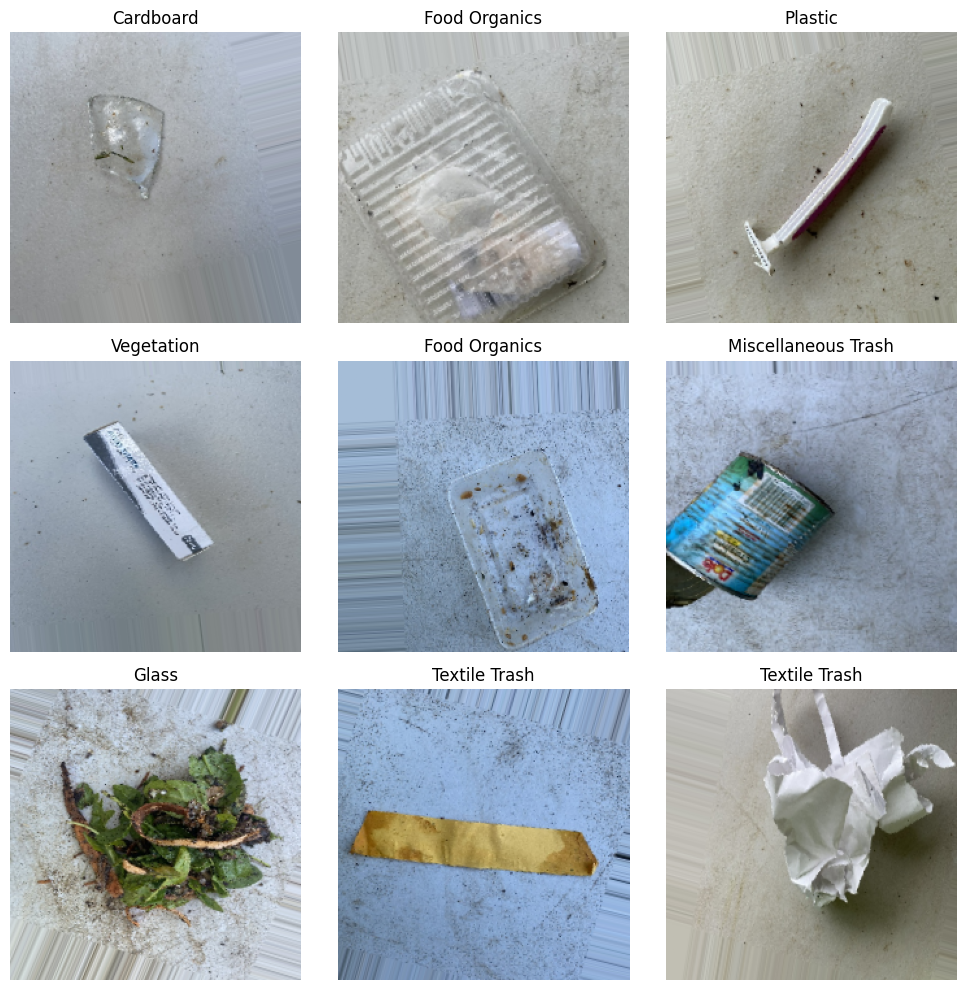

In [10]:
# Définissons les paramètres
img_height = 224
img_width = 224
batch_size = 32

# Créons les répertoires pour train, validation et test
train_dir = '/content/train'
val_dir = '/content/validation'
test_dir = '/content/test'

# Supprimons les répertoires s'ils existent déjà
!rm -rf {train_dir} {val_dir} {test_dir}

# Créons les répertoires
for directory in [train_dir, val_dir, test_dir]:
    for category in categories:
        os.makedirs(os.path.join(directory, category), exist_ok=True)

# Divisons les fichiers et les copier dans les répertoires appropriés
import shutil
import random

for category in categories:
    files = [f for f in os.listdir(os.path.join(data_dir, category))
             if os.path.isfile(os.path.join(data_dir, category, f))]

    # Mélangeons les fichiers
    random.shuffle(files)

    # Calculons les indices de division
    n_files = len(files)
    n_train = int(0.7 * n_files)
    n_val = int(0.15 * n_files)

    # Divisons les fichiers
    train_files = files[:n_train]
    val_files = files[n_train:n_train+n_val]
    test_files = files[n_train+n_val:]

    # Copions les fichiers dans les répertoires appropriés
    for file in train_files:
        shutil.copy(
            os.path.join(data_dir, category, file),
            os.path.join(train_dir, category, file)
        )

    for file in val_files:
        shutil.copy(
            os.path.join(data_dir, category, file),
            os.path.join(val_dir, category, file)
        )

    for file in test_files:
        shutil.copy(
            os.path.join(data_dir, category, file),
            os.path.join(test_dir, category, file)
        )

# Vérifions la répartition des données
train_counts = {category: len(os.listdir(os.path.join(train_dir, category))) for category in categories}
val_counts = {category: len(os.listdir(os.path.join(val_dir, category))) for category in categories}
test_counts = {category: len(os.listdir(os.path.join(test_dir, category))) for category in categories}

print("Répartition des données:")
print(f"Entraînement: {sum(train_counts.values())} images")
for category, count in train_counts.items():
    print(f"  • {category}: {count} images")

print(f"\nValidation: {sum(val_counts.values())} images")
for category, count in val_counts.items():
    print(f"  • {category}: {count} images")

print(f"\nTest: {sum(test_counts.values())} images")
for category, count in test_counts.items():
    print(f"  • {category}: {count} images")

# Créons les générateurs de données avec augmentation pour l'entraînement
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Générateur pour l'ensemble d'entraînement avec augmentation de données
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Générateur pour validation et test (seulement normalisation)
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Créons les générateurs de flux
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    shuffle=True
)

validation_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    shuffle=False
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    shuffle=False
)

# Vérifions les dimensions des données
print(f"\nDimensions des données:")
print(f"Entraînement: {train_generator.samples} échantillons, {train_generator.num_classes} classes")
print(f"Validation: {validation_generator.samples} échantillons")
print(f"Test: {test_generator.samples} échantillons")

# Visualisons quelques exemples avec augmentation de données
import matplotlib.pyplot as plt

def show_batch(image_batch, label_batch, class_names):
    plt.figure(figsize=(10, 10))
    for i in range(min(9, len(image_batch))):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image_batch[i])
        label = int(label_batch[i])
        plt.title(class_names[label])
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Obtenons un batch d'exemples
images, labels = next(train_generator)
show_batch(images, labels, categories)

### Implémentation d'un réseau entièrement connecté (Fully Connected)


In [12]:
# Définissons un modèle entièrement connecté (fully connected model)
def build_fully_connected_model():
    model = models.Sequential([
        layers.Flatten(input_shape=(img_height, img_width, 3)),
        layers.Dense(512, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.4),
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation='softmax')
    ])
    return model

# Créons et compilons le modèle fully connected
fc_model = build_fully_connected_model()
fc_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Affichons le résumé du modèle
fc_model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ flatten (Flatten)                    │ (None, 150528)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │      77,070,848 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 9)                   │           1,161 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 77,236,233 (294.63 MB)

 Trainable params: 77,236,233 (294.63 MB)

 Non-trainable params: 0 (0.00 B)

### Entraînement du modèle Fully Connected

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step - accuracy: 0.1419 - loss: 49.3956

104/104 ━━━━━━━━━━━━━━━━━━━━ 65s 578ms/step - accuracy: 0.1420 - loss: 49.1137 - val_accuracy: 0.1056 - val_loss: 2.7161 - learning_rate: 0.0010
Epoch 2/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step - accuracy: 0.1630 - loss: 2.8457

104/104 ━━━━━━━━━━━━━━━━━━━━ 59s 568ms/step - accuracy: 0.1631 - loss: 2.8433 - val_accuracy: 0.1944 - val_loss: 2.1554 - learning_rate: 0.0010
Epoch 3/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step - accuracy: 0.1869 - loss: 2.3825

104/104 ━━━━━━━━━━━━━━━━━━━━ 64s 612ms/step - accuracy: 0.1869 - loss: 2.3829 - val_accuracy: 0.1944 - val_loss: 2.1458 - learning_rate: 0.0010
Epoch 4/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step - accuracy: 0.1960 - loss: 2.2935

104/104 ━━━━━━━━━━━━━━━━━━━━ 55s 531ms/step - accuracy: 0.1959 - loss: 2.2941 - val_accuracy: 0.1944 - val_loss: 2.1427 - learning_rate: 0.0010
Epoch 5/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step - accuracy: 0.1927 - loss: 2.1904

104/104 ━━━━━━━━━━━━━━━━━━━━ 53s 513ms/step - accuracy: 0.1926 - loss: 2.1905 - val_accuracy: 0.1944 - val_loss: 2.1415 - learning_rate: 0.0010
Epoch 6/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 446ms/step - accuracy: 0.1956 - loss: 2.1454

104/104 ━━━━━━━━━━━━━━━━━━━━ 56s 540ms/step - accuracy: 0.1956 - loss: 2.1454 - val_accuracy: 0.1944 - val_loss: 2.1411 - learning_rate: 0.0010
Epoch 7/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step - accuracy: 0.2010 - loss: 2.1511

104/104 ━━━━━━━━━━━━━━━━━━━━ 54s 519ms/step - accuracy: 0.2010 - loss: 2.1516 - val_accuracy: 0.1944 - val_loss: 2.1411 - learning_rate: 0.0010
Epoch 8/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 458ms/step - accuracy: 0.1948 - loss: 2.1452

104/104 ━━━━━━━━━━━━━━━━━━━━ 64s 617ms/step - accuracy: 0.1948 - loss: 2.1452 - val_accuracy: 0.1944 - val_loss: 2.1410 - learning_rate: 0.0010
Epoch 9/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step - accuracy: 0.1994 - loss: 2.1727

104/104 ━━━━━━━━━━━━━━━━━━━━ 55s 529ms/step - accuracy: 0.1994 - loss: 2.1731 - val_accuracy: 0.1944 - val_loss: 2.1408 - learning_rate: 0.0010
Epoch 10/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 48s 460ms/step - accuracy: 0.2031 - loss: 2.1519 - val_accuracy: 0.1944 - val_loss: 2.1409 - learning_rate: 0.0010
Epoch 11/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 84s 480ms/step - accuracy: 0.2076 - loss: 2.1856 - val_accuracy: 0.1944 - val_loss: 2.1409 - learning_rate: 0.0010
Epoch 12/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step - accuracy: 0.1954 - loss: 2.1691

104/104 ━━━━━━━━━━━━━━━━━━━━ 58s 556ms/step - accuracy: 0.1953 - loss: 2.1695 - val_accuracy: 0.1944 - val_loss: 2.1408 - learning_rate: 0.0010
Epoch 13/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 49s 469ms/step - accuracy: 0.1942 - loss: 2.1490 - val_accuracy: 0.1944 - val_loss: 2.1408 - learning_rate: 1.0000e-04
Epoch 14/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step - accuracy: 0.2002 - loss: 2.1521

104/104 ━━━━━━━━━━━━━━━━━━━━ 54s 517ms/step - accuracy: 0.2001 - loss: 2.1520 - val_accuracy: 0.1944 - val_loss: 2.1408 - learning_rate: 1.0000e-04
Epoch 15/15
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step - accuracy: 0.1959 - loss: 2.1452

104/104 ━━━━━━━━━━━━━━━━━━━━ 61s 586ms/step - accuracy: 0.1958 - loss: 2.1452 - val_accuracy: 0.1944 - val_loss: 2.1408 - learning_rate: 1.0000e-04


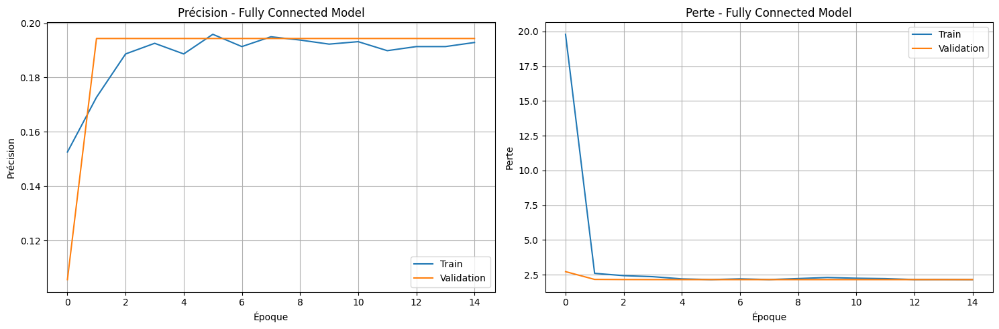

23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - accuracy: 0.0707 - loss: 2.2135
Fully Connected Model - Test accuracy: 0.1933, Test loss: 2.1428


In [13]:
# Callbacks pour améliorer l'entraînement
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

callbacks = [
    EarlyStopping(patience=5, restore_best_weights=True),
    ReduceLROnPlateau(factor=0.1, patience=3, min_lr=1e-6),
    ModelCheckpoint('fc_model_best.h5', save_best_only=True)
]

# Entraînons le modèle fully connected
fc_history = fc_model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator,
    callbacks=callbacks
)

# Visualisons les courbes d'apprentissage
import matplotlib.pyplot as plt

def plot_learning_curves(history, title):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    # Courbe de précision
    ax1.plot(history.history['accuracy'], label='Train')
    ax1.plot(history.history['val_accuracy'], label='Validation')
    ax1.set_title(f'Précision - {title}')
    ax1.set_xlabel('Époque')
    ax1.set_ylabel('Précision')
    ax1.legend()
    ax1.grid(True)

    # Courbe de perte
    ax2.plot(history.history['loss'], label='Train')
    ax2.plot(history.history['val_loss'], label='Validation')
    ax2.set_title(f'Perte - {title}')
    ax2.set_xlabel('Époque')
    ax2.set_ylabel('Perte')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

# Affichons les courbes d'apprentissage
plot_learning_curves(fc_history, 'Fully Connected Model')

# Évaluons sur l'ensemble de test
fc_test_loss, fc_test_acc = fc_model.evaluate(test_generator)
print(f"Fully Connected Model - Test accuracy: {fc_test_acc:.4f}, Test loss: {fc_test_loss:.4f}")

### Entraînement du modèle CNN (MobileNetV2)

Epoch 1/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step - accuracy: 0.3482 - loss: 1.8782

104/104 ━━━━━━━━━━━━━━━━━━━━ 74s 606ms/step - accuracy: 0.3492 - loss: 1.8752 - val_accuracy: 0.6183 - val_loss: 1.0473 - learning_rate: 0.0010
Epoch 2/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step - accuracy: 0.6030 - loss: 1.1306

104/104 ━━━━━━━━━━━━━━━━━━━━ 67s 527ms/step - accuracy: 0.6031 - loss: 1.1302 - val_accuracy: 0.6634 - val_loss: 0.9033 - learning_rate: 0.0010
Epoch 3/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step - accuracy: 0.6514 - loss: 0.9645

104/104 ━━━━━━━━━━━━━━━━━━━━ 51s 495ms/step - accuracy: 0.6514 - loss: 0.9644 - val_accuracy: 0.6845 - val_loss: 0.9014 - learning_rate: 0.0010
Epoch 4/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step - accuracy: 0.6913 - loss: 0.8721

104/104 ━━━━━━━━━━━━━━━━━━━━ 53s 513ms/step - accuracy: 0.6914 - loss: 0.8720 - val_accuracy: 0.6944 - val_loss: 0.8378 - learning_rate: 0.0010
Epoch 5/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step - accuracy: 0.7196 - loss: 0.7862

104/104 ━━━━━━━━━━━━━━━━━━━━ 50s 486ms/step - accuracy: 0.7195 - loss: 0.7863 - val_accuracy: 0.7000 - val_loss: 0.8187 - learning_rate: 0.0010
Epoch 6/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.7463 - loss: 0.7410

104/104 ━━━━━━━━━━━━━━━━━━━━ 83s 497ms/step - accuracy: 0.7462 - loss: 0.7412 - val_accuracy: 0.7028 - val_loss: 0.7968 - learning_rate: 0.0010
Epoch 7/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 0s 451ms/step - accuracy: 0.7280 - loss: 0.7244

104/104 ━━━━━━━━━━━━━━━━━━━━ 50s 480ms/step - accuracy: 0.7282 - loss: 0.7242 - val_accuracy: 0.7169 - val_loss: 0.7504 - learning_rate: 0.0010
Epoch 8/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 55s 525ms/step - accuracy: 0.7767 - loss: 0.6519 - val_accuracy: 0.7085 - val_loss: 0.7799 - learning_rate: 0.0010
Epoch 9/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 49s 473ms/step - accuracy: 0.7627 - loss: 0.6684 - val_accuracy: 0.7099 - val_loss: 0.7572 - learning_rate: 0.0010
Epoch 10/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 49s 467ms/step - accuracy: 0.7698 - loss: 0.6237 - val_accuracy: 0.6972 - val_loss: 0.7947 - learning_rate: 0.0010
Epoch 11/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 51s 487ms/step - accuracy: 0.7972 - loss: 0.5607 - val_accuracy: 0.7183 - val_loss: 0.7561 - learning_rate: 1.0000e-04
Epoch 12/20
104/104 ━━━━━━━━━━━━━━━━━━━━ 50s 485ms/step - accuracy: 0.8114 - loss: 0.5314 - val_accuracy: 0.7310 - val_loss: 0.7549 - learning_rate: 1.0000e-04


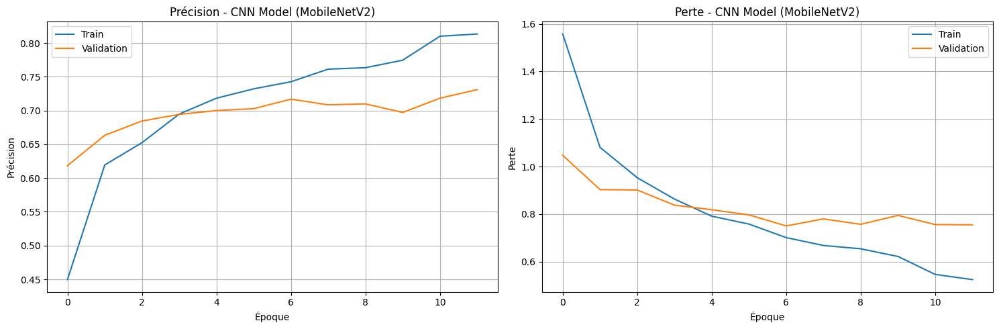

23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 256ms/step - accuracy: 0.7408 - loss: 0.6848
CNN Model - Test accuracy: 0.7385, Test loss: 0.6831


In [14]:
# Réinitialisons et entraînons notre modèle CNN avec transfer learning
cnn_model = build_transfer_learning_model()
cnn_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Callbacks pour le modèle CNN
cnn_callbacks = [
    EarlyStopping(patience=5, restore_best_weights=True),
    ReduceLROnPlateau(factor=0.1, patience=3, min_lr=1e-6),
    ModelCheckpoint('cnn_model_best.h5', save_best_only=True)
]

# Entraînons le modèle CNN
cnn_history = cnn_model.fit(
    train_generator,
    epochs=20,
    validation_data=validation_generator,
    callbacks=cnn_callbacks
)

# Affichons les courbes d'apprentissage
plot_learning_curves(cnn_history, 'CNN Model (MobileNetV2)')

# Évaluons sur l'ensemble de test
cnn_test_loss, cnn_test_acc = cnn_model.evaluate(test_generator)
print(f"CNN Model - Test accuracy: {cnn_test_acc:.4f}, Test loss: {cnn_test_loss:.4f}")

### Different optimizers et learning rate


Training with optimizer: Adam (lr=0.001)
Epoch 1/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 64s 544ms/step - accuracy: 0.3395 - loss: 1.8615 - val_accuracy: 0.6451 - val_loss: 1.0363
Epoch 2/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 58s 560ms/step - accuracy: 0.6170 - loss: 1.0830 - val_accuracy: 0.6577 - val_loss: 0.9291
Epoch 3/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 87s 612ms/step - accuracy: 0.6661 - loss: 0.9084 - val_accuracy: 0.6859 - val_loss: 0.8625
Epoch 4/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 59s 559ms/step - accuracy: 0.6859 - loss: 0.8743 - val_accuracy: 0.6915 - val_loss: 0.8456
Epoch 5/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 57s 546ms/step - accuracy: 0.7239 - loss: 0.7805 - val_accuracy: 0.7070 - val_loss: 0.7901
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 211ms/step - accuracy: 0.7123 - loss: 0.7650
Adam (lr=0.001) - Test accuracy: 0.7302

Training with optimizer: SGD with momentum
Epoch 1/5
104/104 ━━━━━━━━━━━━━━━━━━━━ 68s 588ms/step - accuracy: 0.3352 - loss: 1.8976 - val_accuracy: 0.6113 - val_loss: 1.0495
Epoch 2/5
104/104 ━

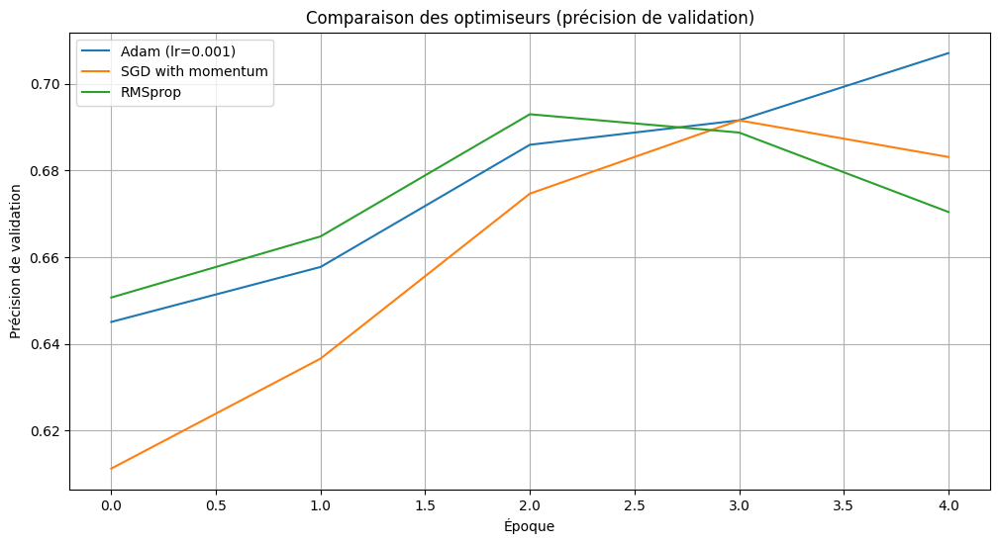

In [15]:
# Essayons différents optimiseurs et taux d'apprentissage
# Uniquement sur le modèle CNN qui est plus performant
optimizers = {
    'Adam (lr=0.001)': tf.keras.optimizers.Adam(learning_rate=0.001),
    'SGD with momentum': tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9),
    'RMSprop': tf.keras.optimizers.RMSprop(learning_rate=0.0005)
}

# Dictionnaire pour stocker les résultats
results = {}

# Pour gagner du temps, réduisons le nombre d'époques
epochs_for_comparison = 5

for name, optimizer in optimizers.items():
    print(f"\nTraining with optimizer: {name}")

    # Créons un nouveau modèle
    model = build_transfer_learning_model()
    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    # Entraînons le modèle
    history = model.fit(
        train_generator,
        epochs=epochs_for_comparison,
        validation_data=validation_generator,
        verbose=1
    )

    # Évaluons sur l'ensemble de test
    test_loss, test_acc = model.evaluate(test_generator)
    print(f"{name} - Test accuracy: {test_acc:.4f}")

    # Stockons les résultats
    results[name] = {
        'history': history.history,
        'test_acc': test_acc,
        'test_loss': test_loss
    }

# Comparons les performances des différents optimiseurs
plt.figure(figsize=(12, 6))
for name, result in results.items():
    plt.plot(result['history']['val_accuracy'], label=name)

plt.title('Comparaison des optimiseurs (précision de validation)')
plt.xlabel('Époque')
plt.ylabel('Précision de validation')
plt.legend()
plt.grid(True)
plt.show()

### Visualisation des prédictions

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


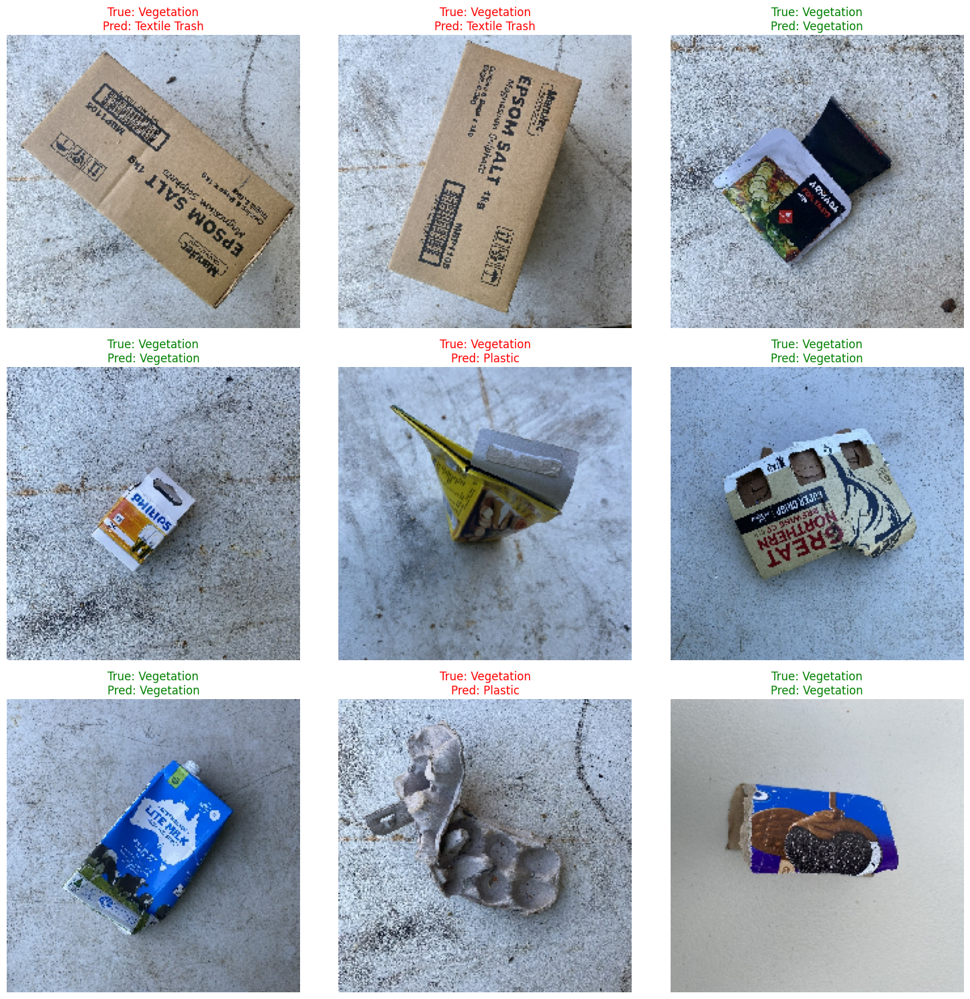

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


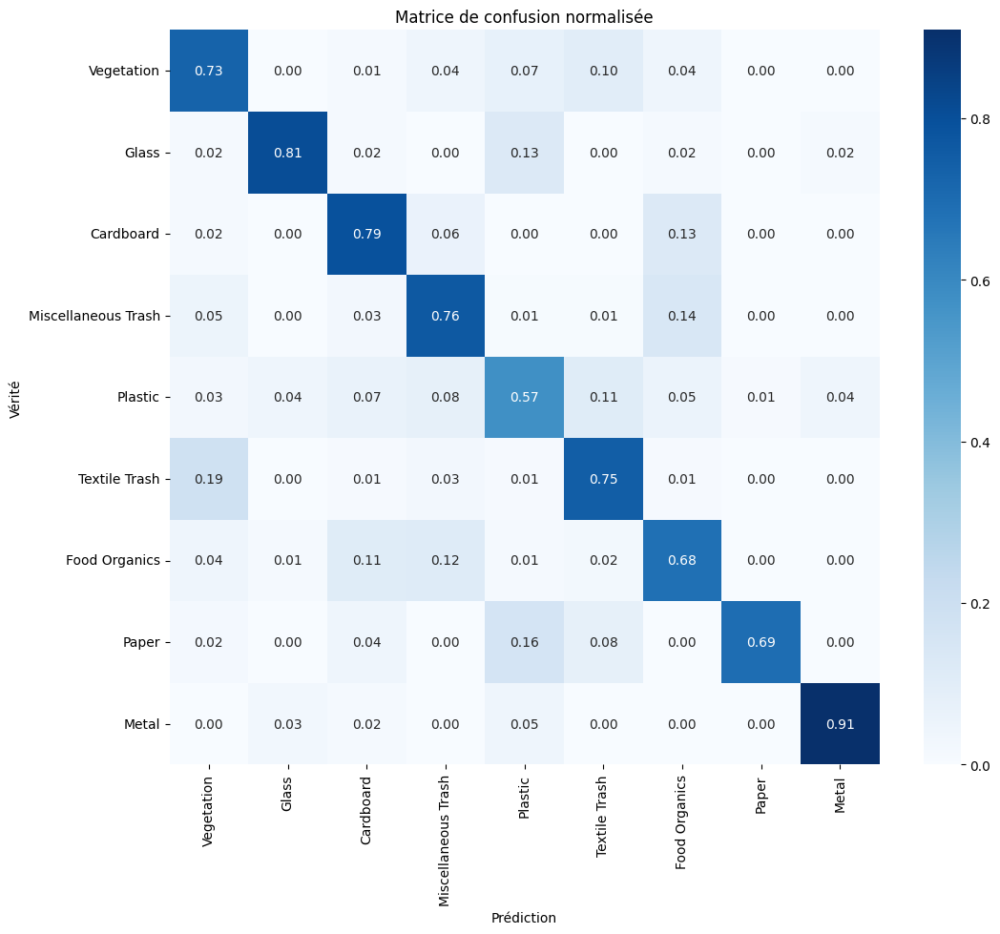

                     precision    recall  f1-score   support

         Vegetation       0.62      0.73      0.67        70
              Glass       0.88      0.81      0.84        63
          Cardboard       0.63      0.79      0.70        63
Miscellaneous Trash       0.75      0.76      0.76       119
            Plastic       0.61      0.57      0.59        75
      Textile Trash       0.71      0.75      0.73        75
      Food Organics       0.74      0.68      0.71       139
              Paper       0.97      0.69      0.81        49
              Metal       0.94      0.91      0.92        66

           accuracy                           0.74       719
          macro avg       0.76      0.74      0.75       719
       weighted avg       0.75      0.74      0.74       719

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step


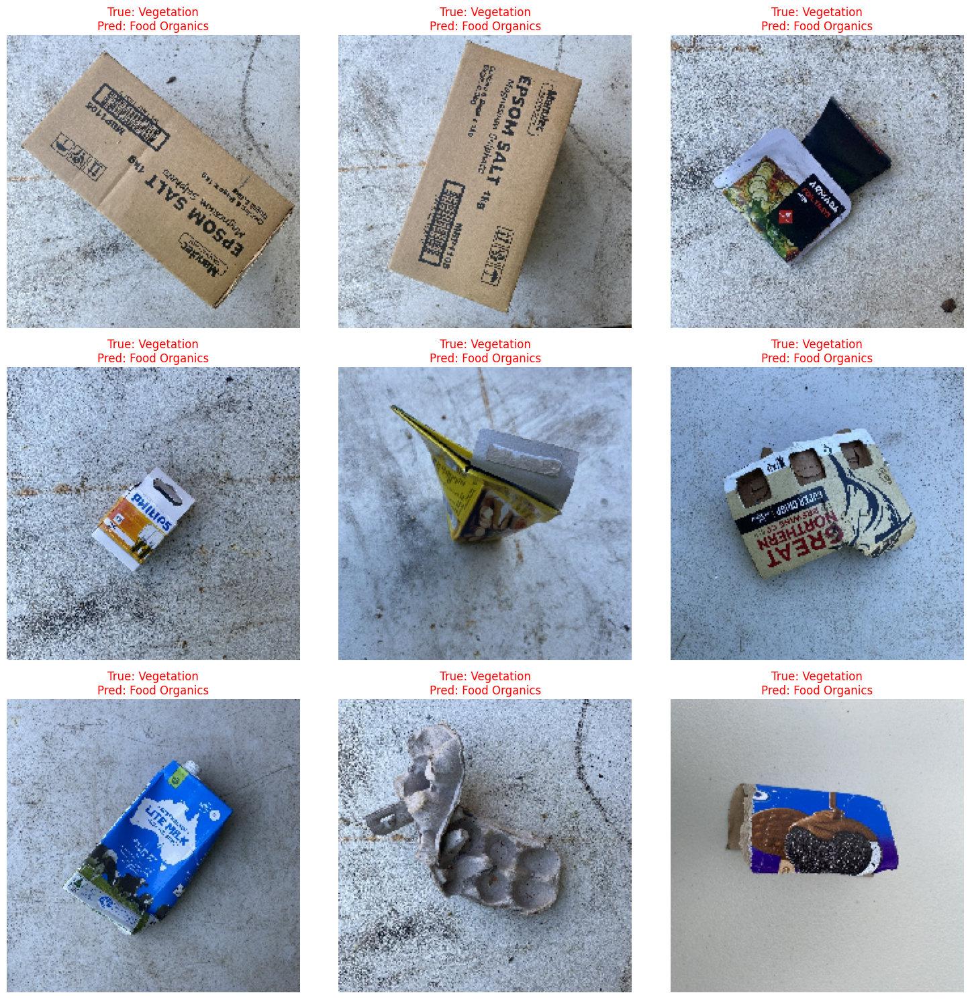

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step


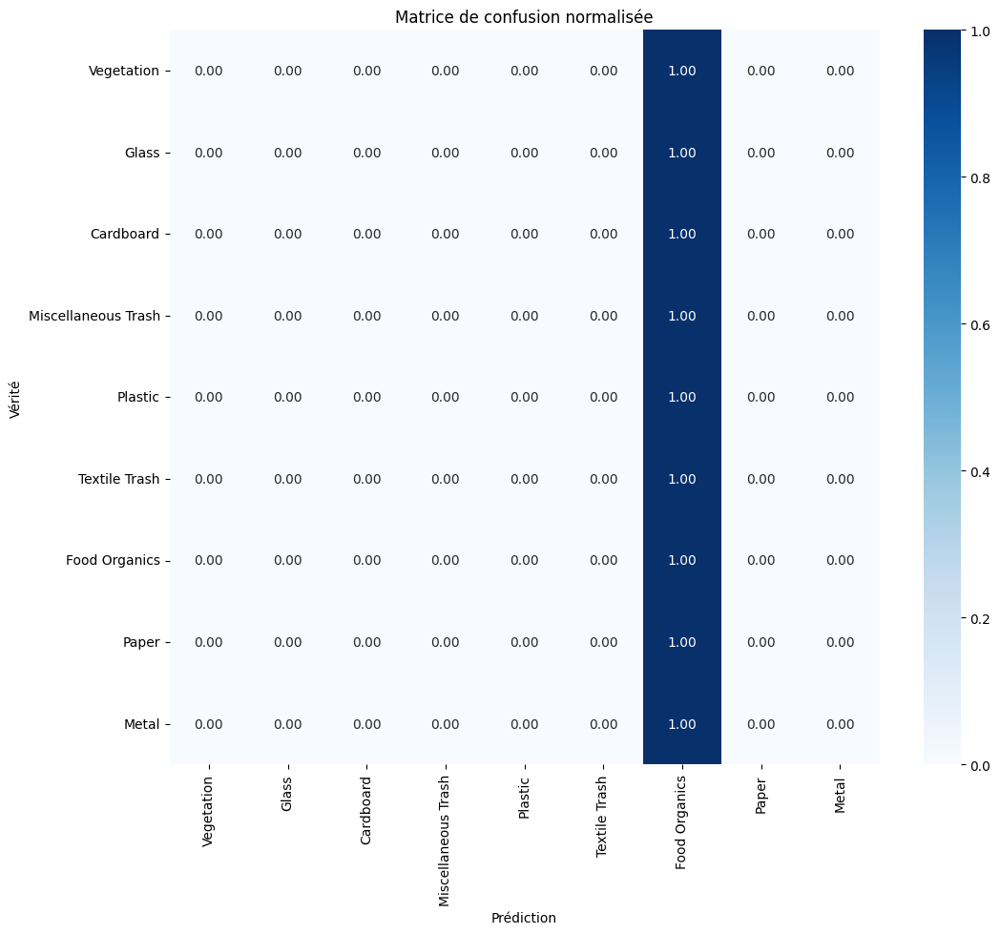

                     precision    recall  f1-score   support

         Vegetation       0.00      0.00      0.00        70
              Glass       0.00      0.00      0.00        63
          Cardboard       0.00      0.00      0.00        63
Miscellaneous Trash       0.00      0.00      0.00       119
            Plastic       0.00      0.00      0.00        75
      Textile Trash       0.00      0.00      0.00        75
      Food Organics       0.19      1.00      0.32       139
              Paper       0.00      0.00      0.00        49
              Metal       0.00      0.00      0.00        66

           accuracy                           0.19       719
          macro avg       0.02      0.11      0.04       719
       weighted avg       0.04      0.19      0.06       719


Résumé des performances:
Modèle CNN (MobileNetV2) - Test accuracy: 0.7385
Modèle Fully Connected - Test accuracy: 0.1933
Amélioration avec CNN: 54.52%


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [18]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

# Visualisons quelques prédictions du meilleur modèle (CNN)
def plot_predictions(model, generator, class_names, num_samples=9):
    # Obtenir un batch d'images et de labels
    images, labels = next(generator)

    # Faisons des prédictions
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)

    # Visualisons les images avec les prédictions
    plt.figure(figsize=(15, 15))
    for i in range(min(num_samples, len(images))):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])

        # Conversion en entier pour indexer la liste class_names
        true_label = int(labels[i])
        true_class = class_names[true_label]
        pred_class = class_names[predicted_classes[i]]

        title = f"True: {true_class}\nPred: {pred_class}"
        color = "green" if true_class == pred_class else "red"

        plt.title(title, color=color)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Fonction améliorée pour générer et afficher la matrice de confusion
def plot_confusion_matrix_fixed(model, generator, class_names):
    # Réinitialisons le générateur
    generator.reset()

    # Collectons les vraies étiquettes et les prédictions ensemble
    y_true = []
    y_pred = []

    # Nombre de batches
    steps = len(generator)

    for i in range(steps):
        # Obtenons un batch d'images et labels
        x_batch, y_batch = next(generator)

        # Faisons des prédictions sur ce batch
        pred_batch = model.predict(x_batch)
        pred_batch_classes = np.argmax(pred_batch, axis=1)

        # Stockons les vraies étiquettes et prédictions
        y_true.extend([int(label) for label in y_batch])
        y_pred.extend(pred_batch_classes)

    # Générons la matrice de confusion
    cm = confusion_matrix(y_true, y_pred)

    # Normalisons la matrice de confusion
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    # Affichons la matrice de confusion
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Prédiction')
    plt.ylabel('Vérité')
    plt.title('Matrice de confusion normalisée')
    plt.show()

    # Affichons le rapport de classification
    print(classification_report(y_true, y_pred, target_names=class_names))

# Exécutons ces fonctions avec les modèles
# Visualisons quelques exemples de prédictions du modèle CNN
plot_predictions(cnn_model, test_generator, categories)

# Affichons la matrice de confusion pour le modèle CNN avec la fonction améliorée
plot_confusion_matrix_fixed(cnn_model, test_generator, categories)

# Visualisons quelques exemples de prédictions du modèle Fully Connected pour comparaison
plot_predictions(fc_model, test_generator, categories)

# Affichons la matrice de confusion pour le modèle Fully Connected avec la fonction améliorée
plot_confusion_matrix_fixed(fc_model, test_generator, categories)

# Affichons un résumé comparatif des performances
print("\nRésumé des performances:")
print(f"Modèle CNN (MobileNetV2) - Test accuracy: {cnn_test_acc:.4f}")
print(f"Modèle Fully Connected - Test accuracy: {fc_test_acc:.4f}")
print(f"Amélioration avec CNN: {(cnn_test_acc - fc_test_acc) * 100:.2f}%")